# Projet 5: Exploratory notebook

## 1. Import data and libraries

In [1]:
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
import unidecode
import folium
import numpy as np
import matplotlib.pyplot as plt

import folium
from folium.plugins import HeatMap
from branca.element import Figure

%matplotlib inline

pd.set_option('display.max_columns', 500)

%load_ext pycodestyle_magic
%pycodestyle_on

In [2]:
customers = pd.read_csv('data/olist_customers_dataset.csv')
sellers = pd.read_csv('data/olist_sellers_dataset.csv')

products = pd.read_csv('data/olist_products_dataset.csv')
product_category = pd.read_csv('data/product_category_name_translation.csv')

orders = pd.read_csv('data/olist_orders_dataset.csv')
order_reviews = pd.read_csv('data/olist_order_reviews_dataset.csv')
order_items = pd.read_csv('data/olist_order_items_dataset.csv')

geolocation = pd.read_csv('data/olist_geolocation_dataset.csv')
payments = pd.read_csv('data/olist_order_payments_dataset.csv')

## 2. Explore dataframes

In [3]:
dfs = [(customers, 'customers'), (sellers, 'sellers'), (products, 'products'),
       (product_category, 'product_category'), (orders, 'orders'),
       (order_reviews, 'order_reviews'), (order_items, 'order_items'),
       (geolocation, 'geolocation'), (payments, 'payments')]

for df, name in dfs:
    print(f"{name.upper()} columns: {list(df.columns)}")
    print(f"{name.upper()} shape: {df.shape}")
    print("_________________________________________")

CUSTOMERS columns: ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']
CUSTOMERS shape: (99441, 5)
_________________________________________
SELLERS columns: ['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state']
SELLERS shape: (3095, 4)
_________________________________________
PRODUCTS columns: ['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']
PRODUCTS shape: (32951, 9)
_________________________________________
PRODUCT_CATEGORY columns: ['product_category_name', 'product_category_name_english']
PRODUCT_CATEGORY shape: (71, 2)
_________________________________________
ORDERS columns: ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
ORDER

### 2.1 Customers

In [4]:
profile_customers = ProfileReport(customers, title="Pandas Profiling Report")
profile_customers

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.2. Sellers

In [5]:
profile_sellers = ProfileReport(sellers, title="Pandas Profiling Report")
profile_sellers

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.3 Products

In [6]:
profile_products = ProfileReport(products, title="Pandas Profiling Report")
profile_products

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# keep product id for the products without informations
products_to_delete = products[products['product_category_name'].isna()]['product_id'].to_list()

# delete products without informations
print(f"product dataframe shape: {products.shape}")
products = products[~products['product_category_name'].isna()]
print(f"product dataframe shape after cleaning: {products.shape}")

2:80: E501 line too long (95 > 79 characters)


product dataframe shape: (32951, 9)
product dataframe shape after cleaning: (32341, 9)


### 2.4 Orders

In [8]:
profile_orders = ProfileReport(orders, title="Pandas Profiling Report")
profile_orders

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.5 Order reviews

In [10]:
profile_order_reviews = ProfileReport(order_reviews,
                                      title="Pandas Profiling Report")
profile_order_reviews

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.6 Order Items

In [11]:
profile_order_items = ProfileReport(order_items,
                                    title="Pandas Profiling Report")
profile_order_items

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.7 Payments

In [12]:
profile_payments = ProfileReport(payments, title="Pandas Profiling Report")
profile_payments

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.8 Geolocation

In [13]:
geolocation.shape

(1000163, 5)

In [14]:
print(geolocation.geolocation_city.unique())
print(geolocation.geolocation_city.nunique())

['sao paulo' 'são paulo' 'sao bernardo do campo' ... 'ciríaco' 'estação'
 'vila lângaro']
8011


In [15]:
geolocation['geolocation_city'] = geolocation['geolocation_city']\
                                     .apply(lambda x:
                                            unidecode.unidecode(x.lower()))

In [16]:
print(geolocation.geolocation_city.unique())
print(geolocation.geolocation_city.nunique())

['sao paulo' 'sao bernardo do campo' 'jundiai' ... 'floriano peixoto'
 'erebango' 'santa cecilia do sul']
5969


### 2.9 Group

In [4]:
for df, name in dfs:
    print(f"{name.upper()} columns: {list(df.columns)}")

CUSTOMERS columns: ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state']
SELLERS columns: ['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state']
PRODUCTS columns: ['product_id', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']
PRODUCT_CATEGORY columns: ['product_category_name', 'product_category_name_english']
ORDERS columns: ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
ORDER_REVIEWS columns: ['review_id', 'order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']
ORDER_ITEMS columns: ['order_id', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_

In [ ]:
# we don't want customers without any order and orders
# that isn't attach at any customer in our list
cust_order = customers.merge(orders, on='customer_id', how='inner')
print('cust_order shape: ', cust_order.shape)

# orders items must be rattached to an
# order an all the orders need to have items
cust_order_items = cust_order.merge(order_items,
                                    on='order_id',
                                    how='inner')
print('cust_order_items shape: ', cust_order_items.shape)

# product must be rattached to an order items
cust_order_items_prod = cust_order_items.merge(products,
                                               on='product_id',
                                               how='inner')
cust_order_items_prod = cust_order_items_prod.merge(product_category,
                                                    on='product_category_name',
                                                    how='inner')
print('cust_order_items_prod shape: ', cust_order_items_prod.shape)

cust_order_items_prod_pay = cust_order_items_prod.merge(payments,
                                                        on='order_id',
                                                        how='left')
print('cust_order_items_prod_pay shape: ', cust_order_items_prod_pay.shape)

cust_order_items_prod_pay_sel = cust_order_items_prod_pay.merge(sellers,
                                                                on='seller_id',
                                                                how='left')
print('cust_order_items_prod_pay_sel shape: ',
      cust_order_items_prod_pay_sel.shape)

# each orders don't need to have a review
df = cust_order_items_prod_pay_sel.merge(order_reviews,
                                         on='order_id',
                                         how='inner')
print('final df shape: ', df.shape)

cust_order shape:  (99441, 12)
cust_order_items shape:  (112650, 18)
cust_order_items_prod shape:  (111023, 27)
cust_order_items_prod_pay shape:  (115881, 31)
cust_order_items_prod_pay_sel shape:  (115881, 34)
final df shape:  (115612, 40)


## 3.RFM

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115612 entries, 0 to 115611
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    115612 non-null  object 
 1   customer_unique_id             115612 non-null  object 
 2   customer_zip_code_prefix       115612 non-null  int64  
 3   customer_city                  115612 non-null  object 
 4   customer_state                 115612 non-null  object 
 5   order_id                       115612 non-null  object 
 6   order_status                   115612 non-null  object 
 7   order_purchase_timestamp       115612 non-null  object 
 8   order_approved_at              115598 non-null  object 
 9   order_delivered_carrier_date   114417 non-null  object 
 10  order_delivered_customer_date  113212 non-null  object 
 11  order_estimated_delivery_date  115612 non-null  object 
 12  order_item_id                 

### 3.1 Clean order table

In [ ]:
# keep only delivered orders
df = df[df['order_status'] == 'delivered']

columns_date = ['order_purchase_timestamp', 'order_approved_at',
                'order_delivered_carrier_date',
                'order_delivered_customer_date',
                'order_estimated_delivery_date']
for column in columns_date:
    df[column] = pd.to_datetime(df[column])

print(df.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113213 entries, 0 to 115611
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    113213 non-null  object        
 1   customer_unique_id             113213 non-null  object        
 2   customer_zip_code_prefix       113213 non-null  int64         
 3   customer_city                  113213 non-null  object        
 4   customer_state                 113213 non-null  object        
 5   order_id                       113213 non-null  object        
 6   order_status                   113213 non-null  object        
 7   order_purchase_timestamp       113213 non-null  datetime64[ns]
 8   order_approved_at              113199 non-null  datetime64[ns]
 9   order_delivered_carrier_date   113211 non-null  datetime64[ns]
 10  order_delivered_customer_date  113205 non-null  datetime64[ns]
 11  

<AxesSubplot:xlabel='month'>

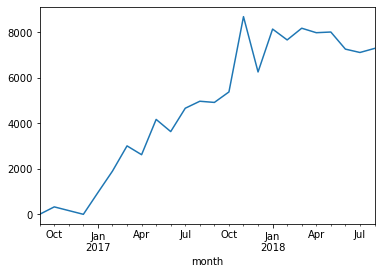

In [ ]:
df['month'] = df['order_purchase_timestamp'].dt.to_period("M")
time_order = df.groupby('month')['order_id'].count()
time_order.plot()

In [ ]:
df = df[df['month'] > '2017-01']

### 3.2 Investigate Price

In [ ]:
order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


#### 3.2.1 Order price

The correlations between the price and the freight_value is: 0.4142043103630355


<AxesSubplot:xlabel='price', ylabel='freight_value'>

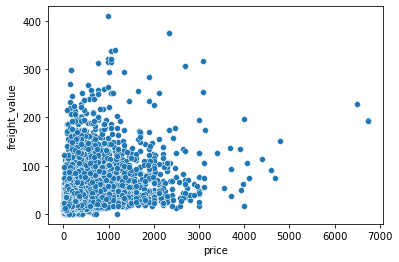

In [ ]:
corr = order_items['price'].corr(order_items['freight_value'])
print(f"The correlations between the price and the freight_value is: {corr}")
sns.scatterplot(data=order_items, x="price", y="freight_value")

In [ ]:
df[df['price'] > 6000][['price', 'product_category_name_english']]

,price,product_category_name_english
5588,6735.0,housewares
91005,6499.0,art


This very expensive items don't look as outliers

#### 3.2.2 Freight price

In [ ]:
df[df['freight_value'] > 300][['freight_value',
                               'product_category_name_english']]

,freight_value,product_category_name_english
4203,339.59,housewares
8167,375.28,housewares
8168,375.28,housewares
53691,312.41,health_beauty
53883,322.10,health_beauty
53885,338.30,health_beauty
56947,314.02,health_beauty
59468,321.88,health_beauty
80734,409.68,baby
80816,306.06,baby


The correlations between the product_weight_g and the freight_value is: 0.6126475266196756


<AxesSubplot:xlabel='product_weight_g', ylabel='freight_value'>

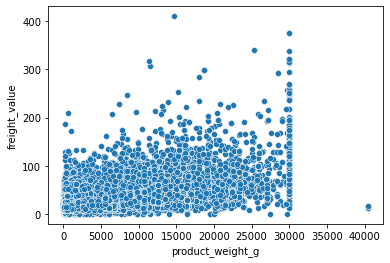

In [ ]:
corr = df['product_weight_g'].corr(df['freight_value'])
print("The correlations between the product_weight_g",
      f"and the freight_value is: {corr}")
sns.scatterplot(data=df, x="product_weight_g", y="freight_value")

In [ ]:
# the weight must be false -W a enlever et enlever aussi le debut du
df[df['product_weight_g'] > 35000][['freight_value',
                                    'product_category_name_english']]

,freight_value,product_category_name_english
73595,12.06,bed_bath_table
73596,16.32,bed_bath_table
73597,16.32,bed_bath_table


In [ ]:
df = df[df['product_weight_g'] < 30001]

### 3.3 Create RFM DF

In [ ]:
recent_date = df['order_purchase_timestamp'].max()

df = df.sort_values('order_purchase_timestamp', ascending=False)

df_rfm = df.groupby('customer_unique_id').agg({
                        'order_purchase_timestamp':
                        lambda x: (recent_date - x.max()).days,
                        'customer_id':'count',
                        'price': 'mean', 
                        'freight_value' : 'mean'}).reset_index()

df_rfm = df_rfm.rename(columns={'order_purchase_timestamp': 'recency', 
                                'customer_id': 'frequency', 
                                'price': 'monetary',
                                 'freight_value': 'price_fv_ratio'})

df_rfm['price_fv_ratio'] = df_rfm.apply(lambda x: x['price_fv_ratio']/x['monetary'] * 100, axis=1)

ValueError: too many values to unpack (expected 3)

In [ ]:
df_rfm

,customer_unique_id,recency,frequency,monetary,price_fv_ratio
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,129.90,9.237875
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,18.90,43.862434
2,0000f46a3911fa3c0805444483337064,536,1,69.00,24.956522
3,0000f6ccb0745a6a4b88665a16c9f078,320,1,25.99,67.833782
4,0004aac84e0df4da2b147fca70cf8255,287,1,180.00,9.383333
...,...,...,...,...,...
90554,fffcf5a5ff07b0908bd4e2dbc735a684,446,2,785.00,31.682803
90555,fffea47cd6d3cc0a88bd621562a9d061,261,1,64.89,30.343658
90556,ffff371b4d645b6ecea244b27531430a,567,1,89.90,25.094549
90557,ffff5962728ec6157033ef9805bacc48,118,1,115.00,16.252174


In [ ]:
ProfileReport(df_rfm)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='frequency'>

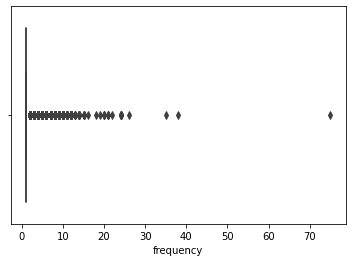

In [ ]:
sns.boxplot(x=df_rfm['frequency'])

<AxesSubplot:xlabel='monetary'>

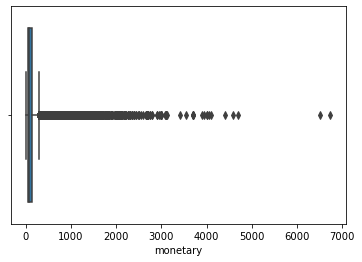

In [ ]:
sns.boxplot(x=df_rfm['monetary'])

<AxesSubplot:xlabel='monetary', ylabel='Count'>

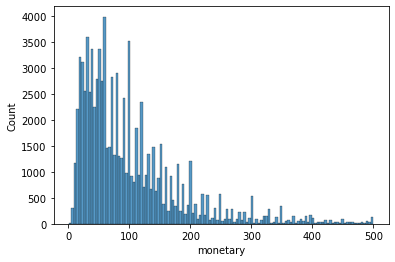

In [ ]:
sns.histplot(x=df_rfm[df_rfm['monetary'] < 500]['monetary'])

### 3.4 Export

In [ ]:
df_rfm.to_csv('data/rfm.csv', index=False)

## 4. Behavior

### 4.1 Products categories

#### 4.1.1 Investigate products categories

In [ ]:
print(df['product_category_name_english'].nunique())
print(df['product_category_name_english'].unique())

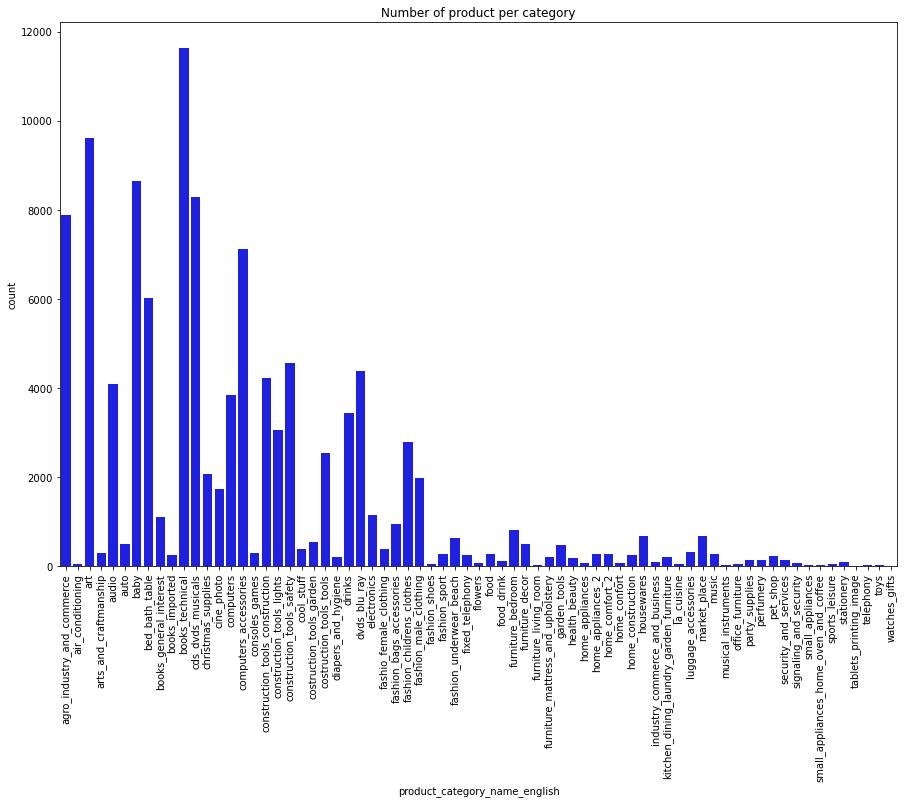

In [ ]:
fig = plt.figure(figsize=(15, 10))
sns.countplot(data=df, x="product_category_name_english", color='blue')
plt.xticks(range(0, df["product_category_name_english"].nunique()),
           sorted(df["product_category_name_english"].unique()),
           rotation=90)
plt.title(f"Number of product per category")
plt.show()

#### 4.1.2 New categories

In [ ]:
df['product_category'] = np.where((df['product_category_name_english'].str
                                   .contains("fashio|luggage|watch") == True),
                                    'fashion',
                           np.where((df['product_category_name_english'].str
                                     .contains("health|beauty|perfum") == True),
                                    'health_beauty',
                           np.where((df['product_category_name_english'].str
                                     .contains("toy|baby|diaper") == True),
                                     'baby',
                           np.where((df['product_category_name_english'].str
                                     .contains("book|cd|dvd|media|music")==True),
                                     'media',
                           np.where((df['product_category_name_english'].str
                                     .contains("grocer|food|drink") == True), 
                                     'grocery',
                           np.where((df['product_category_name_english'].str
                                     .contains("phon|compu|tablet|electro|consol") == True), 
                                     'technology',
                           np.where((df['product_category_name_english'].str
                                     .contains("home|furnitur|garden|bath|house|applianc|flow|cuisine") == True), 
                                     'home_furniture',
                           np.where((df['product_category_name_english'].str
                                     .contains("sport") == True),
                                     'sport',
                                     'other'))))))))

ValueError: too many values to unpack (expected 3)

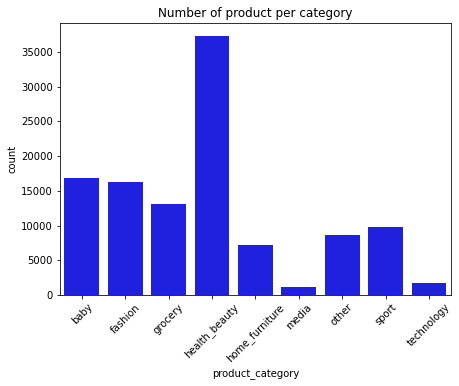

In [ ]:
fig = plt.figure(figsize=(7, 5))
sns.countplot(data=df, x="product_category", color='blue')
plt.xticks(range(0, df["product_category"].nunique()),
           sorted(df["product_category"].unique()),
           rotation=45)
plt.title(f"Number of product per category")
plt.show()

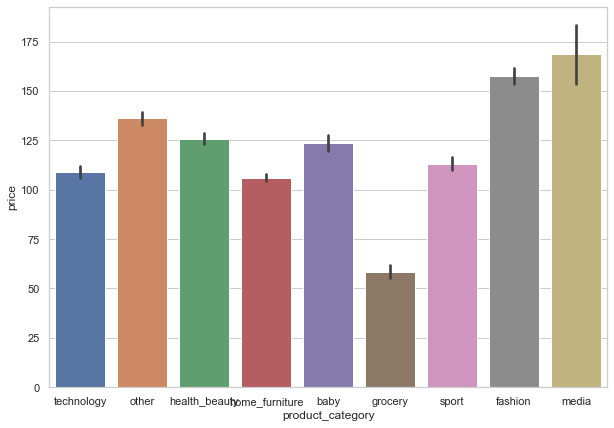

In [ ]:
fig = plt.figure(figsize=(10, 7))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="product_category", y="price", data=df)

In [ ]:
pc = df.groupby('customer_unique_id')['product_category'].agg(list)\
                                                         .reset_index()
pc['product_category'] = pc.apply(lambda x: set(x['product_category']),
                                  axis=1)
pc['number_category'] = pc.apply(lambda x: len(x['product_category']),
                                 axis=1)
pc = pc.merge(df.groupby('customer_unique_id')['product_id'].count()
              .reset_index(),
              how='left', on='customer_unique_id')
pc = pc.rename(columns={'product_id': 'number_products'})
pc = pc.drop(columns=['product_category'])
pc

,customer_unique_id,number_category,number_products
0,0000366f3b9a7992bf8c76cfdf3221e2,1,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,1
2,0000f46a3911fa3c0805444483337064,1,1
3,0000f6ccb0745a6a4b88665a16c9f078,1,1
4,0004aac84e0df4da2b147fca70cf8255,1,1
...,...,...,...
90554,fffcf5a5ff07b0908bd4e2dbc735a684,1,2
90555,fffea47cd6d3cc0a88bd621562a9d061,1,1
90556,ffff371b4d645b6ecea244b27531430a,1,1
90557,ffff5962728ec6157033ef9805bacc48,1,1


C:\Users\letiz\miniconda3\envs\factonics\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='number_category'>

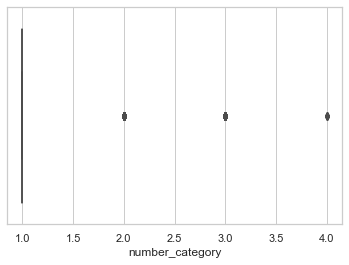

In [ ]:
sns.boxplot(pc['number_category'])

C:\Users\letiz\miniconda3\envs\factonics\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='number_products'>

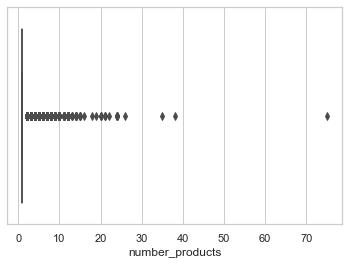

In [ ]:
sns.boxplot(pc['number_products'])

### 4.2 Payments

In [ ]:
df['payment_type'].unique()

array(['credit_card', 'voucher', 'boleto', 'debit_card'], dtype=object)

In [ ]:
df = df.sort_values('order_purchase_timestamp', ascending=False)
pay = df.groupby('customer_unique_id').agg({
            'payment_type':'first'})

ValueError: too many values to unpack (expected 3)

In [ ]:
pay

,payment_type
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,credit_card
0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card
0000f46a3911fa3c0805444483337064,credit_card
0000f6ccb0745a6a4b88665a16c9f078,credit_card
0004aac84e0df4da2b147fca70cf8255,credit_card
...,...
fffcf5a5ff07b0908bd4e2dbc735a684,credit_card
fffea47cd6d3cc0a88bd621562a9d061,credit_card
ffff371b4d645b6ecea244b27531430a,credit_card


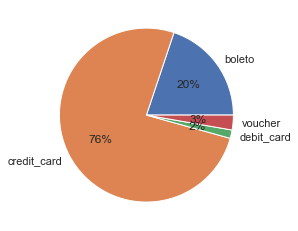

In [ ]:
df_plot = pay.reset_index().groupby('payment_type').count().reset_index()

plt.pie(df_plot['customer_unique_id'], labels=df_plot['payment_type'],
        autopct='%.0f%%')
plt.show()

In [ ]:
pay = df[['customer_unique_id']].join(pd.get_dummies(df['payment_type'])
                                      .add_prefix('type_'))\
                                      .groupby('customer_unique_id')\
                                      .max().reset_index()

In [ ]:
pay.merge(pc, how='inner', on='customer_unique_id')\
   .to_csv('data/behavior.csv', index=False)

## 5. Satisfaction

In [ ]:
order_reviews.info()

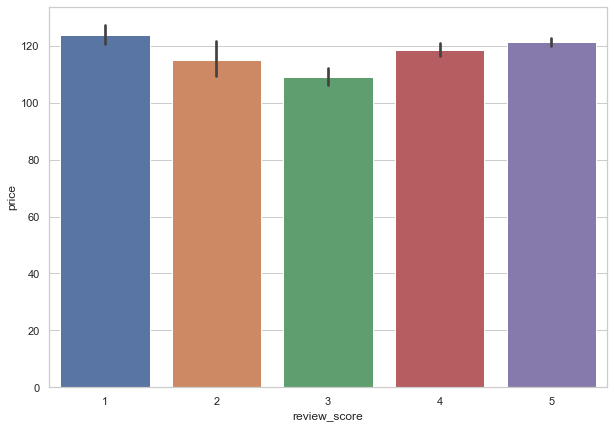

In [ ]:
fig = plt.figure(figsize=(10, 7))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="review_score", y="price", data=df)

In [ ]:
df['review_comment_message'].fillna('', inplace=True)
df['len_comment'] = df.apply(lambda x: len(x['review_comment_message']),
                             axis=1)
df

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,month,product_category,len_comment
21753,898b7fee99c4e42170ab69ba59be0a8b,24ac2b4327e25baf39f2119e4228976a,13483,limeira,SP,35a972d7f8436f405b56e36add1a7140,delivered,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-08-29 16:57:00,2018-08-30 16:23:36,2018-09-05,1,d04857e7b4b708ee8b8b9921163edba3,9f505651f4a6abe901a56cdc21508025,2018-08-31 15:10:26,84.99,8.76,informatica_acessorios,33.0,1127.0,2.0,450.0,16.0,4.0,20.0,computers_accessories,1.0,credit_card,1.0,93.75,4102,sao paulo,SP,390c8570648658f80968ae6f77142429,5,NaN,,2018-08-31 00:00:00,2018-09-09 16:49:27,2018-08,technology,0
115305,496630b6740bcca28fce9ba50d8a26ef,b701bebbdf478f5500348f03aff62121,9541,sao caetano do sul,SP,03ef5dedbe7492bdae72eec50764c43f,delivered,2018-08-29 14:52:00,2018-08-29 15:05:22,2018-08-29 20:01:00,2018-08-30 16:36:59,2018-09-03,1,c7f27c5bef2338541c772b5776403e6a,7d7866a99a8656a42c7ff6352a433410,2018-08-31 15:05:22,24.90,8.33,artigos_de_festas,54.0,429.0,1.0,450.0,28.0,9.0,19.0,party_supplies,1.0,credit_card,1.0,33.23,1320,sao paulo,SP,8a8ebb5019795478156fa952acd050b1,3,Recomendo,,2018-08-31 00:00:00,2018-08-31 20:02:48,2018-08,other,0
51494,6e353700bc7bcdf6ebc15d6de16d7002,7febafa06d9d8f232a900a2937f04338,38600,paracatu,MG,168626408cb32af0ffaf76711caae1dc,delivered,2018-08-29 14:18:28,2018-08-29 14:30:23,2018-08-29 18:51:00,2018-08-30 16:52:31,2018-09-11,1,bdcf6a834e8faa30dac3886c7a58e92e,2a84855fd20af891be03bc5924d2b453,2018-08-31 14:30:23,45.90,15.39,beleza_saude,26.0,394.0,1.0,1614.0,31.0,16.0,28.0,health_beauty,1.0,voucher,1.0,61.29,30111,belo horizonte,MG,39eae4e4d255222202c4255e8eee9084,5,Chegou rápido e correto,Recomendo,2018-08-31 00:00:00,2018-09-02 20:55:45,2018-08,health_beauty,10
87311,e60df9449653a95af4549bbfcb18a6eb,5c58de6fb80e93396e2f35642666b693,80045,curitiba,PR,0b223d92c27432930dfe407c6aea3041,delivered,2018-08-29 14:18:23,2018-08-29 14:31:07,2018-08-29 15:29:00,2018-08-30 16:24:55,2018-09-04,1,2b4472df15512a2825ae86fd9ae79335,67bf6941ba2f1fa1d02c375766bc3e53,2018-08-31 14:30:19,209.00,46.48,moveis_cozinha_area_de_servico_jantar_e_jardim,44.0,112.0,1.0,13550.0,48.0,49.0,49.0,kitchen_dining_laundry_garden_furniture,1.0,credit_card,8.0,510.96,82400,curitiba,PR,6c50d16eb583d5db7e841b77e89b7045,5,NaN,,2018-08-31 00:00:00,2018-10-24 16:27:36,2018-08,home_furniture,0
87312,e60df9449653a95af4549bbfcb18a6eb,5c58de6fb80e93396e2f35642666b693,80045,curitiba,PR,0b223d92c27432930dfe407c6aea3041,delivered,2018-08-29 14:18:23,2018-08-29 14:31:07,2018-08-29 15:29:00,2018-08-30 16:24:55,2018-09-04,2,2b4472df15512a2825ae86fd9ae79335,67bf6941ba2f1fa1d02c375766bc3e53,2018-08-31 14:30:19,209.00,46.48,moveis_cozinha_area_de_servico_jantar_e_jardim,44.0,112.0,1.0,13550.0,48.0,49.0,49.0,kitchen_dining_laundry_garden_furniture,1.0,credit_card,8.0,510.96,82400,curitiba,PR,6c50d16eb583d5db7e841b77e89b7045,5,NaN,,2018-08-31 00:00:00,2018-10-24 16:27:36,2018-08,home_furniture,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63439,e29582b5eb3bee86cc7d5b4f43b63a6a,4bb740141ad510be830b6c6b7914f25b,44700,jacobina,BA,9209e9a4ad05cf804c49922051fc44d9,delivered,2017-02-01 09:08:50,2017-02-02 02:55:16,2017-02-03 15:13:16,201

In [ ]:
df = df.sort_values('order_purchase_timestamp', ascending=False)
satisfaction = df.groupby('customer_unique_id').agg({
            'review_score':'first', 
            'review_comment_message': 'count', 
            'len_comment':'first'}).reset_index()
satisfaction = satisfaction.rename(columns={'review_comment_message': 'review_comment_number'})
satisfaction

,customer_unique_id,review_score,review_comment_number,len_comment
0,0000366f3b9a7992bf8c76cfdf3221e2,5,1,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4,1,0
2,0000f46a3911fa3c0805444483337064,3,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,4,1,12
4,0004aac84e0df4da2b147fca70cf8255,5,1,0
...,...,...,...,...
90554,fffcf5a5ff07b0908bd4e2dbc735a684,5,2,0
90555,fffea47cd6d3cc0a88bd621562a9d061,4,1,0
90556,ffff371b4d645b6ecea244b27531430a,5,1,0
90557,ffff5962728ec6157033ef9805bacc48,5,1,133


ValueError: too many values to unpack (expected 3)

In [ ]:
ProfileReport(satisfaction)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='len_comment', ylabel='Count'>

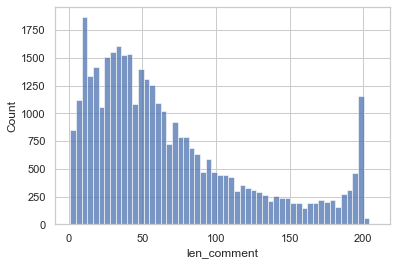

In [ ]:
sns.histplot(satisfaction[satisfaction['len_comment'] > 0]['len_comment'])

In [ ]:
satisfaction

,customer_unique_id,review_score,review_comment_number,len_comment
0,0000366f3b9a7992bf8c76cfdf3221e2,5,1,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4,1,0
2,0000f46a3911fa3c0805444483337064,3,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,4,1,12
4,0004aac84e0df4da2b147fca70cf8255,5,1,0
...,...,...,...,...
90554,fffcf5a5ff07b0908bd4e2dbc735a684,5,2,0
90555,fffea47cd6d3cc0a88bd621562a9d061,4,1,0
90556,ffff371b4d645b6ecea244b27531430a,5,1,0
90557,ffff5962728ec6157033ef9805bacc48,5,1,133


C:\Users\letiz\miniconda3\envs\factonics\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='review_comment_number'>

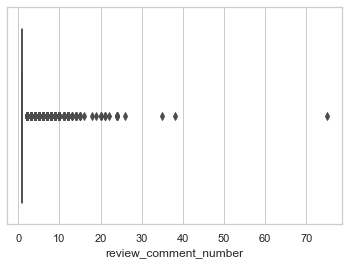

In [ ]:
sns.boxplot(satisfaction['review_comment_number'])

In [ ]:
satisfaction.to_csv('data/satisfaction.csv', index=False)

## 5. Geography

### 5.1 Customers geolocation

In [ ]:
cp = customers.groupby('customer_unique_id')['customer_zip_code_prefix']\
              .first().reset_index()

geo_customer = cp.merge(geolocation, how='inner',
                        left_on='customer_zip_code_prefix',
                        right_on='geolocation_zip_code_prefix')
geo_customer = geo_customer.drop_duplicates('customer_unique_id')
geo_customer

,customer_unique_id,customer_zip_code_prefix,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,7787,-23.335331,-46.828647,cajamar,SP
66,140349f48d58a4c5a30e66fe3da46797,7787,7787,-23.335331,-46.828647,cajamar,SP
132,6a527828dde2b20e0d5cda4e145deeee,7787,7787,-23.335331,-46.828647,cajamar,SP
198,a0b57d0e1a86f382d0711698fa8b1e91,7787,7787,-23.335331,-46.828647,cajamar,SP
264,a696ba5db33cf4835a04dd5965a86781,7787,7787,-23.335331,-46.828647,cajamar,SP
...,...,...,...,...,...,...,...
14549122,ff8892f7c26aa0446da53d01b18df463,45972,45972,-17.197929,-40.220196,ibirajá,BA
14549130,ff88dcb0fdf8854d0eadfa10ea548aa2,68798,68798,-1.226606,-48.293408,santa barbara do para,PA
14549134,ff8d5a4820b9e8b59cdbc2f6102e64e4,45890,45890,-15.463704,-39.644929,pau brasil,BA
14549166,fff3a9369e4b7102fab406a334a678c3,70067,70067,-15.799190,-47.870102,brasilia,DF


In [ ]:
lat_mean = geo_customer['geolocation_lat'].mean()
lon_mean = geo_customer['geolocation_lat'].mean()
map1 = folium.Map(location=[lat_mean, lon_mean],
                  zoom_start=3, min_zoom=2, max_zoom=14)

HeatMap(data=geo_customer[['geolocation_lat', 'geolocation_lng']],
        radius=13).add_to(map1)

folium.TileLayer('Stamen Terrain').add_to(map1)
folium.TileLayer('Stamen Toner').add_to(map1)
folium.TileLayer('Stamen Water Color').add_to(map1)
folium.TileLayer('cartodbpositron').add_to(map1)
folium.TileLayer('cartodbdark_matter').add_to(map1)
folium.LayerControl().add_to(map1)
map1

In [ ]:
df['customer_state'].unique()

array(['SP', 'MG', 'PR', 'RJ', 'RS', 'SC', 'DF', 'ES', 'GO', 'MT', 'MA',
       'PB', 'CE', 'PE', 'PI', 'BA', 'MS', 'AC', 'RN', 'SE', 'PA', 'RO',
       'TO', 'AP', 'AL', 'AM', 'RR'], dtype=object)

In [ ]:
geo_customer[['customer_unique_id', 'geolocation_state']]\
            .to_csv('data/geo.csv', index=False)

### 5.2 Sellers geolocation

In [ ]:
sellers

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


In [ ]:
same_state = df.apply(lambda x: 1
                      if x['customer_state'] == x['seller_state'] else(0),
                      axis=1)

df['customer_seller_same_state'] = same_state
geo = df.groupby('customer_unique_id')['customer_seller_same_state']\
        .mean().reset_index()

In [ ]:
geo_sellers = sellers.merge(geolocation, how='inner',
                            left_on='seller_zip_code_prefix',
                            right_on='geolocation_zip_code_prefix')

map1 = folium.Map(location=[lat_mean, lon_mean], zoom_start=3,
                  min_zoom=2, max_zoom=14)

HeatMap(data=geo_sellers[['geolocation_lat', 'geolocation_lng']],
        radius=13).add_to(map1)

folium.TileLayer('Stamen Terrain').add_to(map1)
folium.TileLayer('Stamen Toner').add_to(map1)
folium.TileLayer('Stamen Water Color').add_to(map1)
folium.TileLayer('cartodbpositron').add_to(map1)
folium.TileLayer('cartodbdark_matter').add_to(map1)
folium.LayerControl().add_to(map1)

map1

<AxesSubplot:xlabel='customer_seller_same_state'>

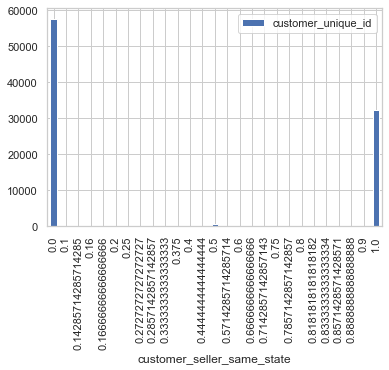

In [ ]:
geo.groupby('customer_seller_same_state').count().plot(kind='bar')

In [ ]:
geo.to_csv('data/geo.csv', index=False)

## 7. Purchase time

In [ ]:
datetime_cols = ["order_purchase_timestamp",
                 "order_delivered_customer_date",
                 "order_estimated_delivery_date"]
for col in datetime_cols:
    df[col] = df[col].astype('datetime64[ns]')
df.info()

In [ ]:
df["delivery_time"] = (df.order_delivered_customer_date -
                       df.order_purchase_timestamp)\
                       .dt.round('1d').dt.days
df['delay_delivery'] = (df.order_delivered_customer_date -
                        df.order_estimated_delivery_date)\
                        .dt.round('1d').dt.days

<AxesSubplot:>

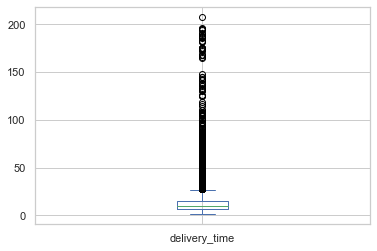

In [ ]:
df["delivery_time"].plot(kind='box')

<AxesSubplot:>

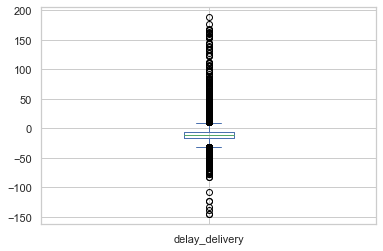

In [ ]:
df['delay_delivery'].plot(kind='box')

In [ ]:
group_col = ['delivery_time', 'delay_delivery']
purchase_time = df.groupby('customer_unique_id')[group_col]\
                  .mean().reset_index()
purchase_time.to_csv('data/time.csv', index=False)